# PRAKTIKUM MINGGU KE 2

## praktik 1 memahami deteksi tepi menggunakan operator sobel

Edge detection merupakan salah satu langkah dasar dalam image processing untuk identifikasi objek berdasarkan berubahan intesitas warna dan pixel yang signifikan.

implementasi dari edge detection yaitu menggunakan operator salah satunya adalah operator sobel. operator sobel merupakan metode berbasis gradien yang menggunakan filter atau kernel ukuran matrix 3 x 3 untuk menghitung turunan intensitas gambar secara horizontal(Gx) dan vertikal (Gy), kemudian dikombinasikan agar mampu menghighlight tepi dengan arah yang jelas dan bervariasi sehingga menghasilkan struktur gambar yang jelas juga

### gambar grayscale

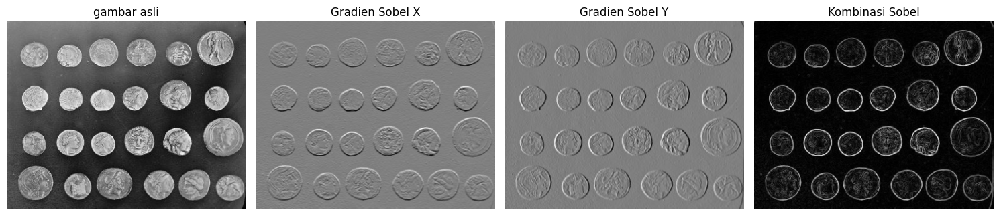

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

#ambil gambar dari skimage
image = data.coins()
#konversi gambar warna ke grayscale
gray_image = color.rgb2gray(image) if image.ndim == 3 else image 

#hitung gradien dengan sobel
sobel_x = filters.sobel_h(gray_image) #sobel horizontal
sobel_y = filters.sobel_v(gray_image) #sobel vertkal
sobel_edge = filters.sobel(gray_image) #kombinasi

#visualiasi
fig, axes = plt.subplots(1, 4, figsize=(15,5))
ax = axes.ravel()

ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title('gambar asli')
ax[0].axis('off')

ax[1].imshow(sobel_x, cmap='gray')
ax[1].set_title('Gradien Sobel X')
ax[1].axis('off')

ax[2].imshow(sobel_y, cmap='gray')
ax[2].set_title('Gradien Sobel Y')
ax[2].axis('off')

ax[3].imshow(sobel_edge, cmap='gray')
ax[3].set_title('Kombinasi Sobel')
ax[3].axis('off')

plt.tight_layout()
plt.show()



### gambar berwarna

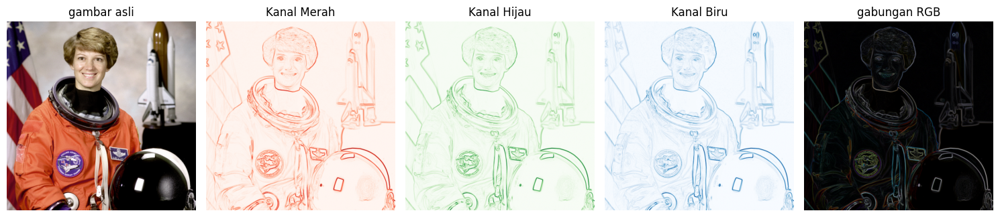

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

#ambil gambar
image = data.astronaut()

#pisahkan warna
red_channel = image[:, :, 0] #merah
green_channel = image[:, :, 1] #hijau
blue_channel = image[:, :, 2] #biru

#hitung gambar warna dengan operator sobel
sobel_red = filters.sobel(red_channel)
sobel_green = filters.sobel(green_channel)
sobel_blue = filters.sobel(blue_channel)

#gabungkan hasil dengan ambil mean
sobel_color = np.stack((sobel_red, sobel_green, sobel_blue), axis=2)

#visualisasi
#visualiasi
fig, axes = plt.subplots(1, 5, figsize=(15,5))
ax = axes.ravel()

ax[0].imshow(image)
ax[0].set_title('gambar asli')
ax[0].axis('off')

ax[1].imshow(sobel_red, cmap='Reds')
ax[1].set_title('Kanal Merah')
ax[1].axis('off')

ax[2].imshow(sobel_green, cmap='Greens')
ax[2].set_title('Kanal Hijau')
ax[2].axis('off')

ax[3].imshow(sobel_blue, cmap='Blues')
ax[3].set_title('Kanal Biru')
ax[3].axis('off')

ax[4].imshow(sobel_color)
ax[4].set_title('gabungan RGB')
ax[4].axis('off')

plt.tight_layout()
plt.show()

## Praktik 2 memahami deteksi tepi dengan operator Roberts

hampir mirip dengan operator sobel, perbedaannya ada pada jumlah kernel yang digunakan yaitu menggunakan ukuran matrik 2 x 2 yang mengukur intensitas secara diagonal.

operator robert digunakan karena sederhana dan kecepatan komputasi yang tinggi walaupun noise lebih terasa atau sensitif terhadap noise

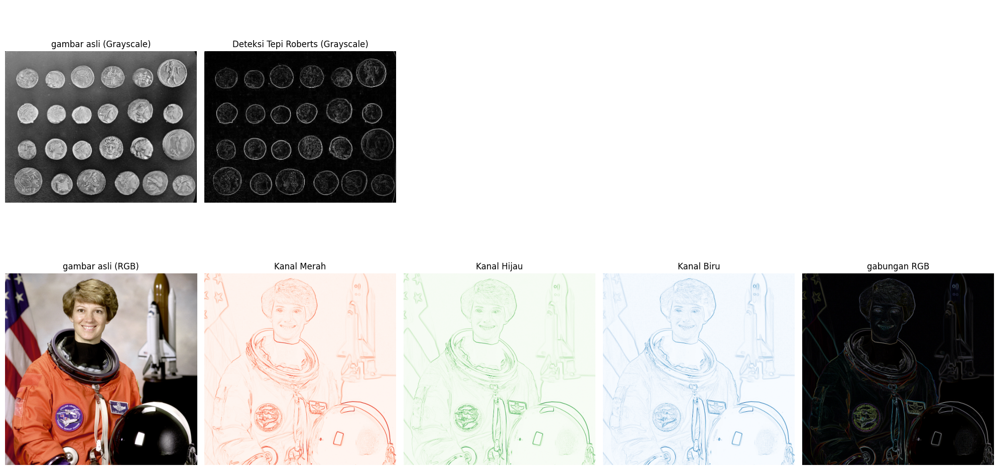

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color, filters

#ambil gambar dari skimage (graycsale)
image = data.coins()
#konversi gambar warna ke grayscale
gray_image = color.rgb2gray(image) if image.ndim == 3 else image 
#hitung gradien dengan sobel
robert_gray = filters.roberts(gray_image) 

#ambil gambar berwarna
image_color = data.astronaut()
#pisahkan warna
red_channel = image_color[:, :, 0] #merah
green_channel = image_color[:, :, 1] #hijau
blue_channel = image_color[:, :, 2] #biru
#hitung gambar warna dengan operator sobel
roberts_red = filters.roberts(red_channel)
roberts_green = filters.roberts(green_channel)
roberts_blue = filters.roberts(blue_channel)
#gabungkan
roberts_color = np.stack((roberts_red, roberts_green, roberts_blue), axis=2)

#visualisasi
fig, axis = plt.subplots(2, 5, figsize=(20,10))
ax = axis.ravel()

#gambar grayscale
ax[0].imshow(gray_image, cmap='gray')
ax[0].set_title('gambar asli (Grayscale)')
ax[0].axis('off')

ax[1].imshow(robert_gray, cmap='gray')
ax[1].set_title('Deteksi Tepi Roberts (Grayscale)')
ax[1].axis('off')

for i in range(2, 5):
    ax[i].axis("off")
    
#gambar berwarna
ax[5].imshow(image_color)
ax[5].set_title('gambar asli (RGB)')
ax[5].axis('off')

ax[6].imshow(roberts_red, cmap='Reds')
ax[6].set_title('Kanal Merah')
ax[6].axis('off')

ax[7].imshow(roberts_green, cmap='Greens')
ax[7].set_title('Kanal Hijau')
ax[7].axis('off')

ax[8].imshow(roberts_blue, cmap='Blues')
ax[8].set_title('Kanal Biru')
ax[8].axis('off')

ax[9].imshow(roberts_color)
ax[9].set_title('gabungan RGB')
ax[9].axis('off')

plt.tight_layout()
plt.show()

## Praktik 3 memahami perbandingan deteksi tepi grayscale beberapa operator 

Operator yang dibandingkan yaitu Sobel, Roberts, Prewitt, Kirsch, dan Canny. setiap operator memiliki karakteristiknya sendiri seperti sensitivitas terhadap noise, ketebalan tepi, atau kompleksitas komputasi. tentu tiap operator memiliki performa yang berbeda-beda

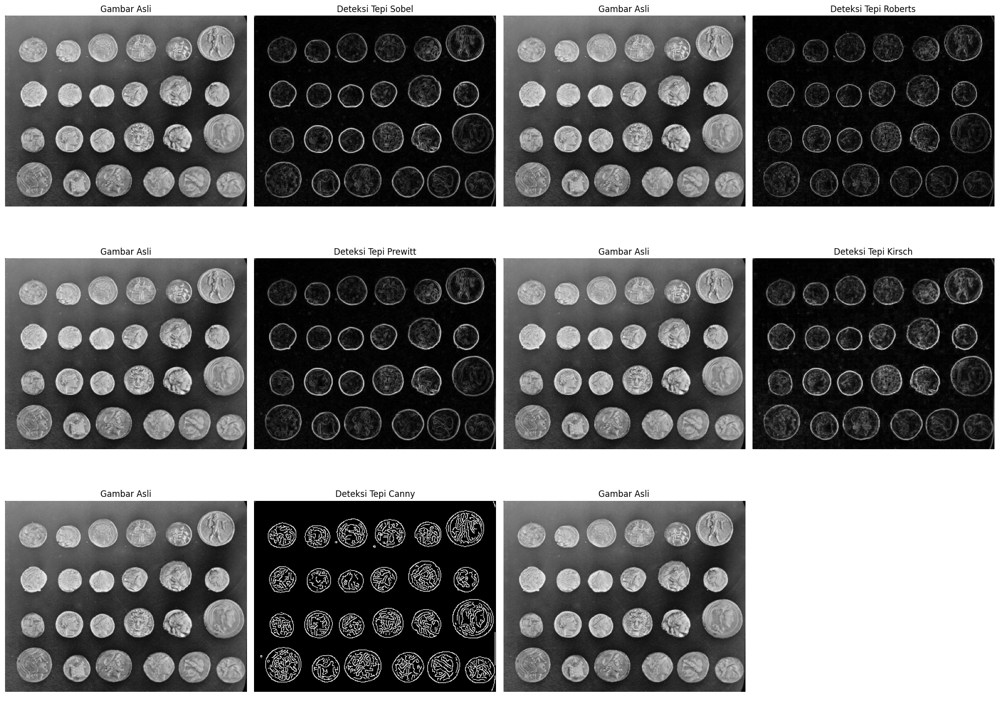

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature
from skimage.filters.rank import gradient
from skimage.morphology import disk

# Ambil gambar grayscale
gray_image = data.coins()

# Terapkan berbagai operator deteksi tepi
sobel_edge = filters.sobel(gray_image)
roberts_edge = filters.roberts(gray_image)
prewitt_edge = filters.prewitt(gray_image)
kirsch_edge = gradient(gray_image, disk(1))
canny_edge = feature.canny(gray_image, sigma=1)

# Visualisasi hasil
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
ax = axes.ravel()

# Daftar gambar dan judul
images = [gray_image, sobel_edge, gray_image, roberts_edge,
          gray_image, prewitt_edge, gray_image, kirsch_edge,
          gray_image, canny_edge, gray_image]  # Posisi terakhir kosong

titles = ["Gambar Asli", "Deteksi Tepi Sobel", "Gambar Asli", "Deteksi Tepi Roberts",
          "Gambar Asli", "Deteksi Tepi Prewitt", "Gambar Asli", "Deteksi Tepi Kirsch",
          "Gambar Asli", "Deteksi Tepi Canny", "Gambar Asli"]

# Tampilkan gambar
for i in range(11):
    ax[i].imshow(images[i], cmap='gray')
    ax[i].set_title(titles[i])
    ax[i].axis("off")

ax[11].axis("off")

plt.tight_layout()
plt.show()


## Praktik 4 memahami perbandingan deteksi beberapa operator 

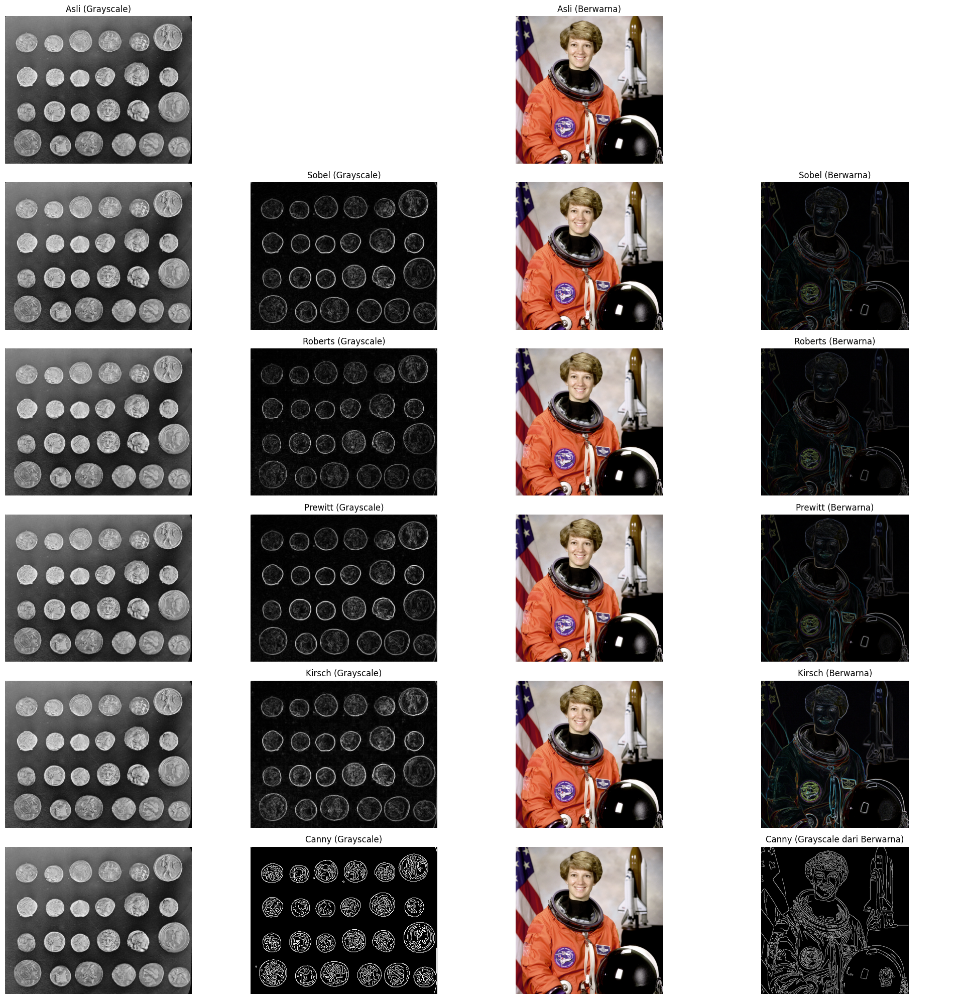

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, feature, color
from skimage.filters.rank import gradient
from skimage.morphology import disk

# Ambil gambar bawaan dari skimage
gray_img = data.coins()
color_img = data.astronaut()

# Operator deteksi tepi untuk grayscale
sobel_gray = filters.sobel(gray_img)
roberts_gray = filters.roberts(gray_img)
prewitt_gray = filters.prewitt(gray_img)
kirsch_gray = gradient(gray_img, disk(1))
canny_gray = feature.canny(gray_img, sigma=1)

# Fungsi deteksi tepi untuk tiap kanal RGB
def apply_edge_detection(image, operator):
    return np.stack([operator(image[:, :, i]) for i in range(3)], axis=2)

# Operator deteksi tepi untuk gambar berwarna
sobel_color = apply_edge_detection(color_img, filters.sobel)
roberts_color = apply_edge_detection(color_img, filters.roberts)
prewitt_color = apply_edge_detection(color_img, filters.prewitt)
kirsch_color = apply_edge_detection(color_img, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(color_img), sigma=1)

# Visualisasi hasil dalam grid 6x4
fig, axes = plt.subplots(6, 4, figsize=(20, 20))
ax = axes.ravel()

def plot_images(index, img1, img2, title):
    ax[index].imshow(img1, cmap='gray')
    ax[index].axis("off")
    ax[index + 1].imshow(img2, cmap='gray')
    ax[index + 1].set_title(title)
    ax[index + 1].axis("off")

# Baris 1: Gambar asli
ax[0].imshow(gray_img, cmap='gray')
ax[0].set_title("Asli (Grayscale)")
ax[0].axis("off")
ax[1].axis("off")
ax[2].imshow(color_img)
ax[2].set_title("Asli (Berwarna)")
ax[2].axis("off")
ax[3].axis("off")

# Baris 2-6: Deteksi tepi
plot_images(4, gray_img, sobel_gray, "Sobel (Grayscale)")
plot_images(6, color_img, sobel_color, "Sobel (Berwarna)")
plot_images(8, gray_img, roberts_gray, "Roberts (Grayscale)")
plot_images(10, color_img, roberts_color, "Roberts (Berwarna)")
plot_images(12, gray_img, prewitt_gray, "Prewitt (Grayscale)")
plot_images(14, color_img, prewitt_color, "Prewitt (Berwarna)")
plot_images(16, gray_img, kirsch_gray, "Kirsch (Grayscale)")
plot_images(18, color_img, kirsch_color, "Kirsch (Berwarna)")
plot_images(20, gray_img, canny_gray, "Canny (Grayscale)")
plot_images(22, color_img, canny_color, "Canny (Grayscale dari Berwarna)")

plt.tight_layout()
plt.show()


## Penugasan: deteksi tepi beberapa operator menggunakan gambar sendiri

d:\SOFTWARE\INSTALLED\Python313\Lib\site-packages\IPython\core\interactiveshell.py:3546: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


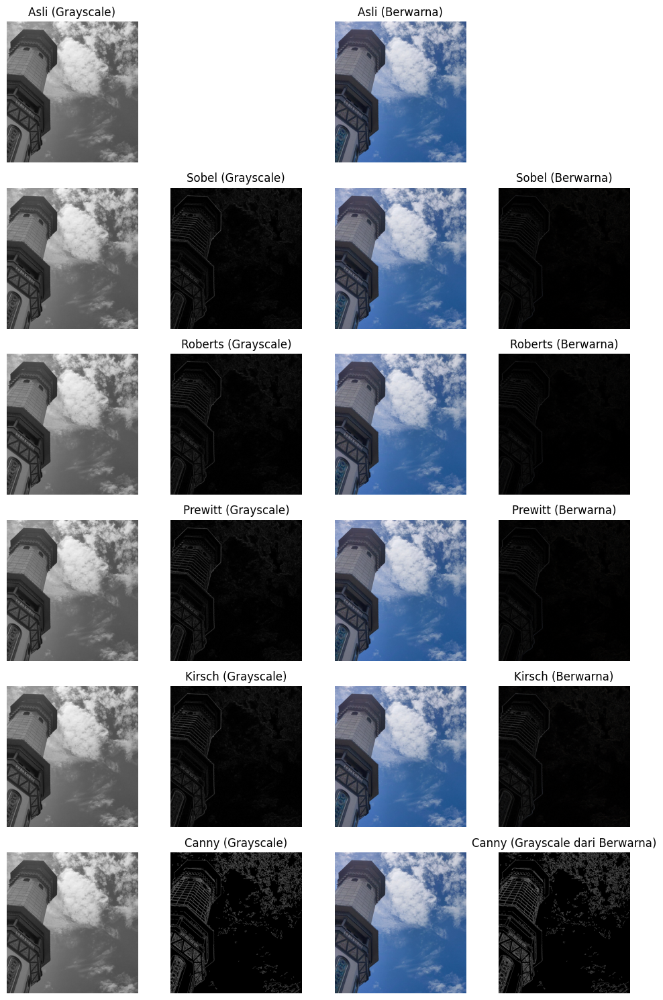

In [36]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, filters, feature, color
from skimage.filters.rank import gradient
from skimage.morphology import disk


# Ambil gambar yang sudah diupload
image_path = "image_praktik2.jpg" 
color_img = io.imread(image_path)
gray_img = color.rgb2gray(color_img)

# Operator deteksi tepi untuk grayscale
sobel_gray = filters.sobel(gray_img)
roberts_gray = filters.roberts(gray_img)
prewitt_gray = filters.prewitt(gray_img)
kirsch_gray = gradient(gray_img, disk(1))
canny_gray = feature.canny(gray_img, sigma=1)

# Fungsi deteksi tepi untuk tiap kanal RGB
def apply_edge_detection(image, operator):
    return np.stack([operator(image[:, :, i]) for i in range(3)], axis=2)

# Operator deteksi tepi untuk gambar berwarna
sobel_color = apply_edge_detection(color_img, filters.sobel)
roberts_color = apply_edge_detection(color_img, filters.roberts)
prewitt_color = apply_edge_detection(color_img, filters.prewitt)
kirsch_color = apply_edge_detection(color_img, lambda img: gradient(img, disk(1)))
canny_color = feature.canny(color.rgb2gray(color_img), sigma=1)

# Visualisasi hasil dalam grid 6x4
fig, axes = plt.subplots(6, 4, figsize=(10, 15))
ax = axes.ravel()

def plot_images(index, img1, img2, title):
    ax[index].imshow(img1, cmap='gray')
    ax[index].axis("off")
    ax[index + 1].imshow(img2, cmap='gray')
    ax[index + 1].set_title(title)
    ax[index + 1].axis("off")

# Baris 1: Gambar asli
ax[0].imshow(gray_img, cmap='gray')
ax[0].set_title("Asli (Grayscale)")
ax[0].axis("off")
ax[1].axis("off")
ax[2].imshow(color_img)
ax[2].set_title("Asli (Berwarna)")
ax[2].axis("off")
ax[3].axis("off")

# Baris 2-6: Deteksi tepi
plot_images(4, gray_img, sobel_gray, "Sobel (Grayscale)")
plot_images(6, color_img, sobel_color, "Sobel (Berwarna)")
plot_images(8, gray_img, roberts_gray, "Roberts (Grayscale)")
plot_images(10, color_img, roberts_color, "Roberts (Berwarna)")
plot_images(12, gray_img, prewitt_gray, "Prewitt (Grayscale)")
plot_images(14, color_img, prewitt_color, "Prewitt (Berwarna)")
plot_images(16, gray_img, kirsch_gray, "Kirsch (Grayscale)")
plot_images(18, color_img, kirsch_color, "Kirsch (Berwarna)")
plot_images(20, gray_img, canny_gray, "Canny (Grayscale)")
plot_images(22, color_img, canny_color, "Canny (Grayscale dari Berwarna)")

plt.tight_layout()
plt.show()
